# <center><font color="red">PRCP-1007-LiverPatientPred</center>

## PROBLEM STATEMENT

--> Liver disease cases have been steadily increasing due to factors such as excessive alcohol consumption, exposure to harmful gases, intake of contaminated food, pickles, and drug usage. Early detection and diagnosis can help reduce the burden on healthcare professionals and improve patient outcomes.  


--> This project aims to analyze a liver patient dataset collected from Northeast of Andhra Pradesh to identify key patterns and trends in liver disease cases. A predictive model will be developed using various machine learning classifiers to classify patients as having liver disease or not.  


--> Additionally, an in-depth analysis will be conducted to justify the choice of models, highlighting the most influential factors contributing to liver disease. This study seeks to provide data-driven insights that can assist healthcare professionals in early diagnosis and effective intervention strategies.

## DOMAIN ANALYSIS AND ATTRIBUTES

 This project falls under "Healthcare" domain focusing on predicting whether an individual has liver disease or not based on the key attributes such as,

1. Age                        : Age of the patient

2. Gender                     : Gender of the patient, categorized as male & female

3. Total Bilirubin            : It is the overall Bilirubin in the blood, produced from breakdown of Red Blood Cells (RBCs). It consists of both Direct Bilirubin & Indirect Bilirubin.

4. Direct Bilirubin           : Refers to Bilirubin that has been processed by liver

5. Alkaline Phosphotase       : An enzyme related to Bile ducts

6. Alamine Aminotransferase   : An enzyme primarily found in the liver

7. Aspartate Aminotransferase : Found in various tissues, including the liver & heart

8. Total Protiens             : Sum of albumin & globulin in the blood

9. Albumin                    : Protein made by the liver to maintain blood volume & pressure

10. Albumin and Globulin Ratio : Provides insight into liver function & immune status

11. Target                     : Field used to split the data into two sets (1 : patient with liver disease and 2: patient with no liver disease)

# 1. IMPORTING LIBRARIES

In [1]:
# Importing pandas library for working with data sets
import pandas as pd

# Importing numpy library for working with arrays
import numpy as np

# Importing matplotlib.pyplot for visualization
import matplotlib.pyplot as plt
%matplotlib inline

# Importing seaborn library for advanced visualization
import seaborn as sns

# Importing warnings for disable warnings from the code
import warnings
# To ignore the warnings
warnings.filterwarnings('ignore')

# YData Profiling for generating an automatic exploratory data analysis (EDA) report
from ydata_profiling import ProfileReport

# Importing OneHotEncoder for encoding 
from sklearn.preprocessing import OneHotEncoder

# MinMaxScaler for feature scaling to bring values within a specific range
from sklearn.preprocessing import MinMaxScaler

# Importing train_test_split for splitting data into training and testing sets for model evaluation
from sklearn.model_selection import train_test_split

# Importing LogisticRegression
from sklearn.linear_model import LogisticRegression

# Importing DecisionTreeClassifier 
from sklearn.tree import DecisionTreeClassifier

# Importing an ensemble model RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Importing an advanced boosting model GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier 

# Importing an efficient and optimized version of gradient- XGBoost (Classifier)
from xgboost import XGBClassifier

# Importing SVC model from sklearn
from sklearn.svm import SVC

# Importing KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

# Importing GridSearchCV for Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Importing RandomizedSearchCV for hyperparameter tuning using randomized search
from sklearn.model_selection import RandomizedSearchCV

# Importing Multi-layer Perceptron (MLP) Classifier
from sklearn.neural_network import MLPClassifier

# Importing performance metrics for model evaluation
# accuracy_score,confusion_matrix,classification_report,etc.
from sklearn.metrics import *

# 2. LOADING THE DATA

In [2]:
# The dataset doesn't have any column names
a = pd.read_csv('Indian Liver Patient Dataset (ILPD).csv')
a

,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.9,1
0,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
1,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
2,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
3,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
4,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
...,...,...,...,...,...,...,...,...,...,...,...
577,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
578,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
579,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
580,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [3]:
# Assigning column names to each column 
columns=['Age','Gender','Total_Bilirubin','Direct_Bilirubin','Alkaline_Phosphotase','Alamine_Aminotransferase','Aspartate_Aminotransferase','Total_Protiens','Albumin','Albumin_and_Globulin_Ratio','Target']
columns

['Age',
 'Gender',
 'Total_Bilirubin',
 'Direct_Bilirubin',
 'Alkaline_Phosphotase',
 'Alamine_Aminotransferase',
 'Aspartate_Aminotransferase',
 'Total_Protiens',
 'Albumin',
 'Albumin_and_Globulin_Ratio',
 'Target']

In [4]:
# Final data with assigned column names in the dataset
data = pd.read_csv('Indian Liver Patient Dataset (ILPD).csv',names=columns)
data

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...,...,...
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1


In [5]:
data.shape

(583, 11)

# 3. HANDLING DUPLICATES 

In [6]:
# Checking total duplicates
data.duplicated().sum()

13

In [7]:
# Duplicated rows
duplicate_rows= data[data.duplicated()]
duplicate_rows               

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
19,40,Female,0.9,0.3,293,232,245,6.8,3.1,0.80,1
26,34,Male,4.1,2.0,289,875,731,5.0,2.7,1.10,1
34,38,Female,2.6,1.2,410,59,57,5.6,3.0,0.80,2
55,42,Male,8.9,4.5,272,31,61,5.8,2.0,0.50,1
62,58,Male,1.0,0.5,158,37,43,7.2,3.6,1.00,1
106,36,Male,5.3,2.3,145,32,92,5.1,2.6,1.00,2
108,36,Male,0.8,0.2,158,29,39,6.0,2.2,0.50,2
138,18,Male,0.8,0.2,282,72,140,5.5,2.5,0.80,1
143,30,Male,1.6,0.4,332,84,139,5.6,2.7,0.90,1
158,72,Male,0.7,0.1,196,20,35,5.8,2.0,0.50,1


In [8]:
# Dropping the duplicates
data.drop_duplicates(inplace=True)

In [9]:
# Verification
data.duplicated().sum()

0

# 4. BASIC CHECKS

In [10]:
# Visualizing the first 10 rows of the data
data.head(10)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1
5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1
6,26,Female,0.9,0.2,154,16,12,7.0,3.5,1.00,1
7,29,Female,0.9,0.3,202,14,11,6.7,3.6,1.10,1
8,17,Male,0.9,0.3,202,22,19,7.4,4.1,1.20,2
9,55,Male,0.7,0.2,290,53,58,6.8,3.4,1.00,1


In [11]:
# Visualizing the last 10 rows of the data
data.tail(10)

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
573,32,Male,3.7,1.6,612,50,88,6.2,1.9,0.40,1
574,32,Male,12.1,6.0,515,48,92,6.6,2.4,0.50,1
575,32,Male,25.0,13.7,560,41,88,7.9,2.5,2.50,1
576,32,Male,15.0,8.2,289,58,80,5.3,2.2,0.70,1
577,32,Male,12.7,8.4,190,28,47,5.4,2.6,0.90,1
578,60,Male,0.5,0.1,500,20,34,5.9,1.6,0.37,2
579,40,Male,0.6,0.1,98,35,31,6.0,3.2,1.10,1
580,52,Male,0.8,0.2,245,48,49,6.4,3.2,1.00,1
581,31,Male,1.3,0.5,184,29,32,6.8,3.4,1.00,1
582,38,Male,1.0,0.3,216,21,24,7.3,4.4,1.50,2


In [12]:
# Checking the column names of the data
data.columns

Index(['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'Target'],
      dtype='object')

In [13]:
# Checking the index of the data
data.index

Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       573, 574, 575, 576, 577, 578, 579, 580, 581, 582],
      dtype='int64', length=570)

In [14]:
# Checking the number of rows and columns of the data
data.shape  

(570, 11)

In [15]:
# Checking the basic information of the data
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 570 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         570 non-null    int64  
 1   Gender                      570 non-null    object 
 2   Total_Bilirubin             570 non-null    float64
 3   Direct_Bilirubin            570 non-null    float64
 4   Alkaline_Phosphotase        570 non-null    int64  
 5   Alamine_Aminotransferase    570 non-null    int64  
 6   Aspartate_Aminotransferase  570 non-null    int64  
 7   Total_Protiens              570 non-null    float64
 8   Albumin                     570 non-null    float64
 9   Albumin_and_Globulin_Ratio  566 non-null    float64
 10  Target                      570 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 53.4+ KB


In [16]:
# Checking the statistical information of the numerical column in the data
data.describe()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
count,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,566.000000,570.000000
mean,44.849123,3.321754,1.497544,291.750877,79.728070,109.380702,6.496316,3.148947,0.948004,1.287719
std,16.242182,6.267941,2.833231,245.291859,181.471697,290.880671,1.088300,0.796813,0.319635,0.453097
min,4.000000,0.400000,0.100000,63.000000,10.000000,10.000000,2.700000,0.900000,0.300000,1.000000
25%,33.000000,0.800000,0.200000,176.000000,23.000000,25.000000,5.800000,2.600000,0.700000,1.000000
50%,45.000000,1.000000,0.300000,208.000000,35.000000,41.000000,6.600000,3.100000,0.950000,1.000000
75%,58.000000,2.600000,1.300000,298.000000,60.000000,86.750000,7.200000,3.800000,1.100000,2.000000
max,90.000000,75.000000,19.700000,2110.000000,2000.000000,4929.000000,9.600000,5.500000,2.800000,2.000000


In [17]:
# Checking the statistical information of the categorical column in the data
data.describe(include="O")

,Gender
count,570
unique,2
top,Male
freq,430


In [18]:
# Checking the unique values for all the columns in the data
for i in data.columns:
    print(f"                                {i.title()}                        ")
    print("\n")
    print(f"* The number of unique values in {i} column :",data[i].nunique())
    print(">>",data[i].unique())
    print('==============================================================================')
    print("\n")

                                Age                        


* The number of unique values in Age column : 72
>> [65 62 58 72 46 26 29 17 55 57 64 74 61 25 38 33 40 51 63 34 20 84 52 30
 48 47 45 42 50 85 35 21 32 31 54 37 66 60 19 75 68 70 49 14 13 18 39 27
 36 24 28 53 15 56 44 41  7 22  8  6  4 43 23 12 69 16 78 11 73 67 10 90]


                                Gender                        


* The number of unique values in Gender column : 2
>> ['Female' 'Male']


                                Total_Bilirubin                        


* The number of unique values in Total_Bilirubin column : 113
>> [ 0.7 10.9  7.3  1.   3.9  1.8  0.9  0.6  2.7  1.1  1.6  2.2  2.9  6.8
  1.9  4.1  6.2  4.   2.6  1.3 14.2  1.4  2.4 18.4  3.1  8.9  0.8  2.8
  2.   5.7  8.6  5.8  5.2  3.8  6.6  0.5  5.3  3.2  1.2 12.7 15.9 18.
 23.  22.7  1.7  3.  11.3  4.7  4.2  3.5  5.9  8.7 11.  11.5  4.5 75.
 22.8 14.1 14.8 10.6  8.   1.5  2.1  6.3  2.3 27.2  2.5  3.6 30.5 16.4
 14.5 18.5 23.2  3.7  3.3  7.1  6

In [19]:
# Checking the value_counts 
colls = ["Gender","Total_Protiens","Albumin","Target"]
for i in data[colls]:
    print(data[i].value_counts())
    print('============================')
    print("\n")

Gender
Male      430
Female    140
Name: count, dtype: int64


Total_Protiens
7.0    32
6.0    28
6.8    27
6.9    25
6.2    24
7.1    22
7.2    20
8.0    20
6.4    18
7.3    18
6.1    18
5.5    16
6.6    16
5.6    16
6.7    15
7.5    15
6.5    15
7.9    14
6.3    14
5.9    14
5.4    13
5.8    12
5.2    12
5.7    11
7.4    11
5.3    10
5.1     9
7.8     9
5.0     9
7.6     9
8.2     8
4.9     6
8.1     6
8.5     5
4.5     4
4.4     4
4.6     4
4.3     3
3.6     3
8.4     3
8.6     3
8.3     3
7.7     3
4.8     3
3.9     2
9.2     2
4.1     2
4.7     2
4.0     2
3.8     2
2.7     1
2.8     1
9.5     1
9.6     1
8.9     1
8.7     1
3.0     1
3.7     1
Name: count, dtype: int64


Albumin
3.0    44
4.0    37
2.9    29
3.1    27
3.2    26
3.9    25
2.5    23
3.5    23
2.7    22
3.3    21
3.4    21
3.7    20
2.6    20
2.0    19
2.8    18
3.6    17
4.1    16
2.4    16
3.8    15
2.1    14
4.3    13
2.3    12
4.2    12
1.8    12
2.2    11
1.6     8
4.4     8
1.9     7
4.5     6
4.9     4
4.6   

# 4. EXPLORATORY DATA ANALYSIS (EDA)

## 4.1. PROFILE REPORT

In [20]:
report = ProfileReport(data, title="EDA",explorative=False)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 4.2. UNIVARIATE ANALYSIS FOR NUMERICAL COLUMNS

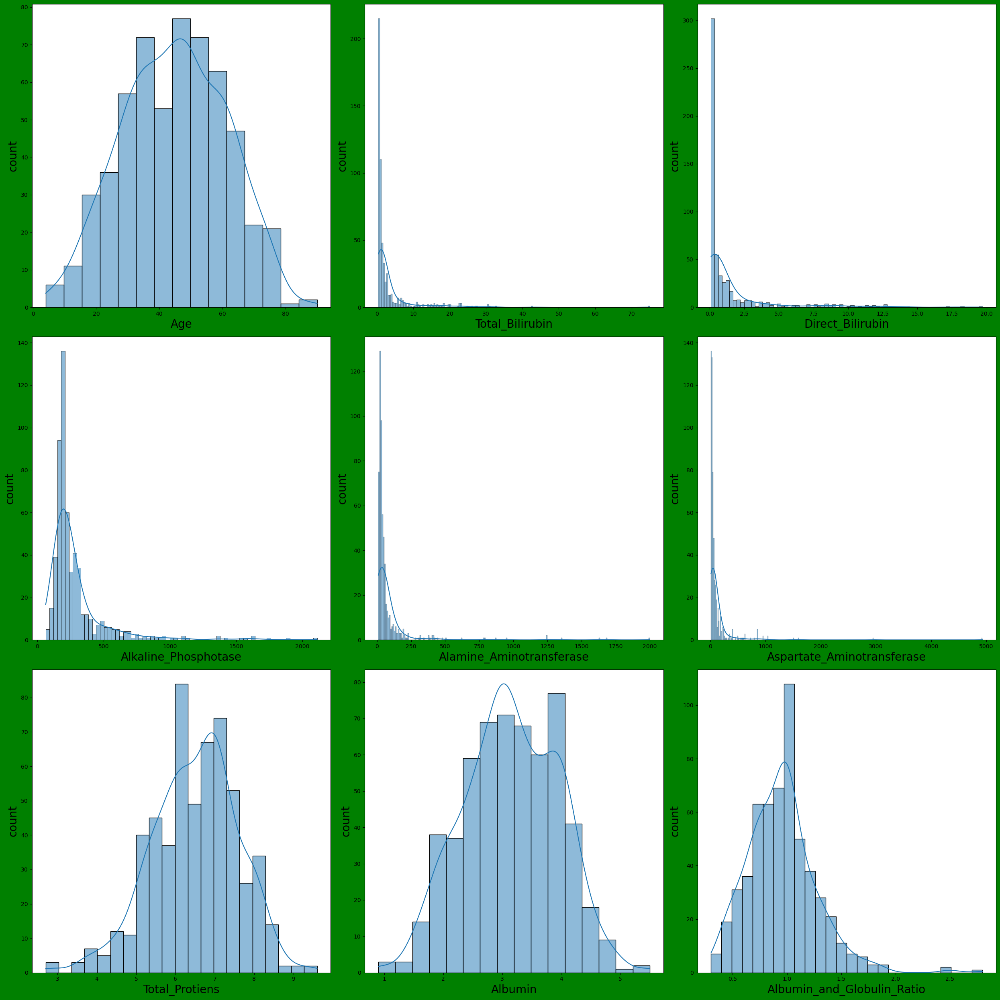

In [21]:
plt.figure(figsize=(25,25),facecolor='green')
plotnumber=1
for i in data.select_dtypes(exclude='object'):
    if plotnumber<10:
        ax=plt.subplot(3,3,plotnumber)
        sns.histplot(data[i],kde=True)
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.tight_layout()
plt.show()

## 4.3. UNIVARIATE ANALYSIS FOR CATEGORICAL COLUMNS

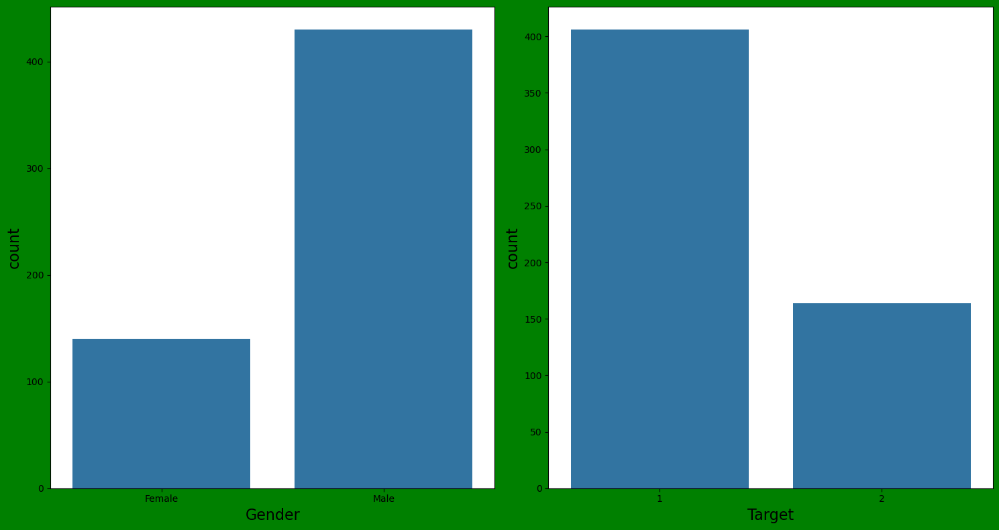

In [22]:
plt.figure(figsize=(15,8),facecolor='green')
pltnum=1
a=['Gender','Target']
for i in a:
    if pltnum<=2:
        ax=plt.subplot(1,2,pltnum)
        sns.countplot(x=data[i],data=data)
        plt.xlabel(i,fontsize=16)
        plt.ylabel('count',fontsize=16)

    pltnum+=1
plt.tight_layout()
plt.show()

In [23]:
data['Gender'].value_counts()

Gender
Male      430
Female    140
Name: count, dtype: int64

In [24]:
len(data[data['Target']==1])

406

In [25]:
len(data[data['Target']==2])

164

## 4.4. BIVARIATE ANALYSIS

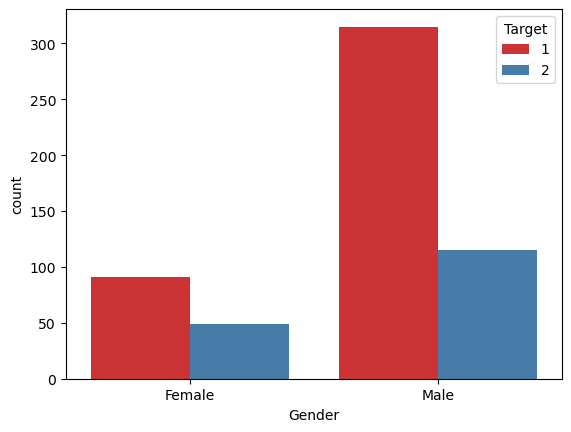

In [26]:
# Countplot for "Gender of the patient" column with respect to the "Target" column
sns.countplot(data,x='Gender',hue='Target',palette="Set1")
plt.show()

In [27]:
len(data[(data["Target"]==1) & (data["Gender"]=="Male")]) 

315

In [28]:
len(data[(data["Target"]==1) & (data["Gender"]=="Female")]) 

91

### TOTAL BILIRUBIN

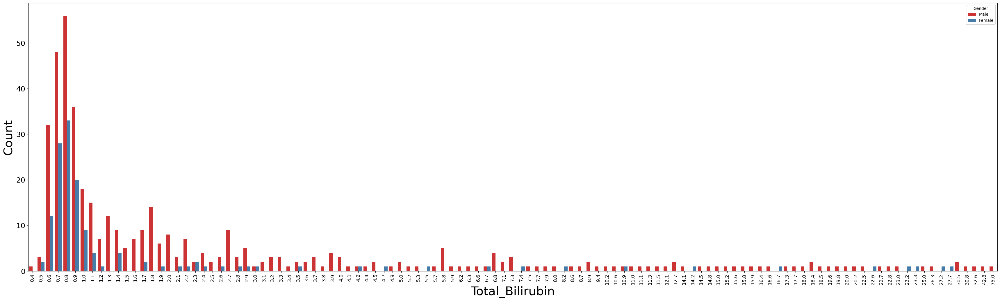

In [29]:
plt.figure(figsize=(43,12))
sns.countplot(data,x="Total_Bilirubin",hue='Gender',palette="Set1")
plt.xlabel('Total_Bilirubin', fontsize=30)
plt.ylabel("Count", fontsize=30)

plt.xticks(rotation=90, fontsize=12)  
plt.yticks(fontsize=18)  

plt.show()

In [30]:
gen_male= data[data["Gender"] == 'Male']
gen_female= data[data["Gender"] == 'Female']

tot_bil_counts_1= gen_male["Total_Bilirubin"].value_counts()
tot_bil_counts_2= gen_female["Total_Bilirubin"].value_counts()

highest_tot_bil_1= tot_bil_counts_1.idxmax()  
highest_count_1 = tot_bil_counts_1.max()

highest_tot_bil_2= tot_bil_counts_2.idxmax()
highest_count_2 = tot_bil_counts_2.max()

print(f"Total Bilirubin with highest occurrence (Target=Male): {highest_tot_bil_1} (Count: {highest_count_1})")
print(f"Total Bilirubin with highest occurrence (Target=Female): {highest_tot_bil_2} (Count: {highest_count_2})")

print('\n')

tot_bil_max=data.groupby(["Gender"])["Total_Bilirubin"].max()
print(tot_bil_max)

Total Bilirubin with highest occurrence (Target=Male): 0.8 (Count: 56)
Total Bilirubin with highest occurrence (Target=Female): 0.8 (Count: 33)


Gender
Female    27.7
Male      75.0
Name: Total_Bilirubin, dtype: float64


In [31]:
data[data["Total_Bilirubin"]==75.0] # 55 years old male having total bilirubin of 75.0 mg/dl

# A 55-year-old man with 75 mg/dL bilirubin has a very low chance of survival without aggressive critical care and possibly a liver transplant. 
# If bilirubin levels cross 30 mg/dL (males) or 25 mg/dL (females), survival is at risk without immediate intensive care.

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
166,55,Male,75.0,3.6,332,40,66,6.2,2.5,0.6,1


In [32]:
data[data["Total_Bilirubin"]==27.7] # 50 years old female having total bilirubin of 27.7 mg/dl

# A 50-year-old female with 27.7 mg/dL bilirubin is in a critical condition, but survival is possible with aggressive treatment.

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
547,50,Female,27.7,10.8,380,39,348,7.1,2.3,0.4,1


#### INSIGHTS

Males → > 20 mg/dL needs aggressive treatment

Females → > 15 mg/dL needs aggressive treatment

If bilirubin levels cross 30 mg/dL (males) or 25 mg/dL (females), survival is at risk without immediate intensive care.

In [33]:
len(data[(data["Total_Bilirubin"]>25) & (data["Gender"]=='Male')])

7

In [34]:
len(data[(data["Total_Bilirubin"]>20) & (data["Gender"]=='Female')])

5

### DIRECT BILIRUBIN

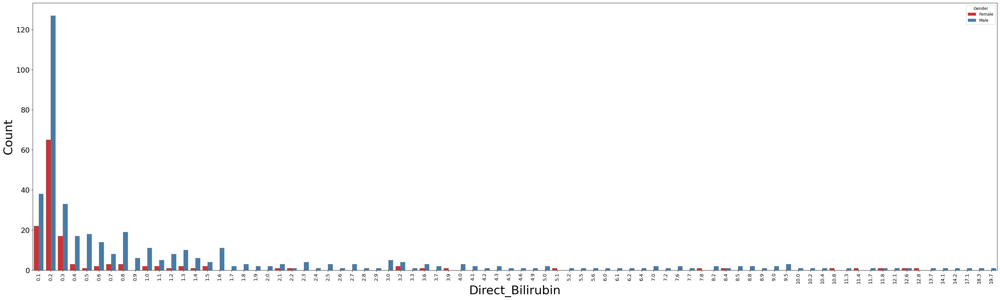

In [35]:
plt.figure(figsize=(43,12))
sns.countplot(data,x="Direct_Bilirubin",hue='Gender',palette="Set1")
plt.xlabel('Direct_Bilirubin', fontsize=30)
plt.ylabel("Count", fontsize=30)

plt.xticks(rotation=90, fontsize=12)  
plt.yticks(fontsize=18)  

plt.show()

In [36]:
gen_male_dir= data[data["Gender"] == 'Male']
gen_female_dir= data[data["Gender"] == 'Female']

dir_bil_counts_1= gen_male["Direct_Bilirubin"].value_counts()
dir_bil_counts_2= gen_female["Direct_Bilirubin"].value_counts()

highest_dir_bil_1= dir_bil_counts_1.idxmax()  
highest_count_1_dir = dir_bil_counts_1.max()

highest_dir_bil_2= dir_bil_counts_2.idxmax()
highest_count_2_dir = dir_bil_counts_2.max()

print(f"Direct Bilirubin with highest occurrence (Target=Male): {highest_dir_bil_1} (Count: {highest_count_1_dir})")
print(f"Direct Bilirubin with highest occurrence (Target=Female): {highest_dir_bil_2} (Count: {highest_count_2_dir})")

print('\n')

dir_bil_max=data.groupby(["Gender"])["Direct_Bilirubin"].max()
print(dir_bil_max)

Direct Bilirubin with highest occurrence (Target=Male): 0.2 (Count: 127)
Direct Bilirubin with highest occurrence (Target=Female): 0.2 (Count: 65)


Gender
Female    12.8
Male      19.7
Name: Direct_Bilirubin, dtype: float64


In [37]:
data[data["Direct_Bilirubin"]==12.8] # 45 years old female has direct bilirubin value of 12.8

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
447,45,Female,23.3,12.8,1550,425,511,7.7,3.5,0.8,1


In [38]:
data[data["Direct_Bilirubin"]==19.7] # 26 years old male has direct bilirubin value of 19.7

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
559,26,Male,42.8,19.7,390,75,138,7.5,2.6,0.5,1


#### INSIGHTS

Males → > 6 mg/dL needs aggressive treatment

Females → > 5 mg/dL needs aggressive treatment

If Direct Bilirubin exceeds 10 mg/dL (males) or 8 mg/dL (females), urgent intensive care is required, as it indicates severe bile obstruction, liver failure, or life-threatening conditions.

In [39]:
len(data[(data["Direct_Bilirubin"]>6) & (data["Gender"]=='Male')])

36

In [40]:
len(data[(data["Direct_Bilirubin"]>5) & (data["Gender"]=='Female')])

8

### ALKALINE PHOSPHOTASE

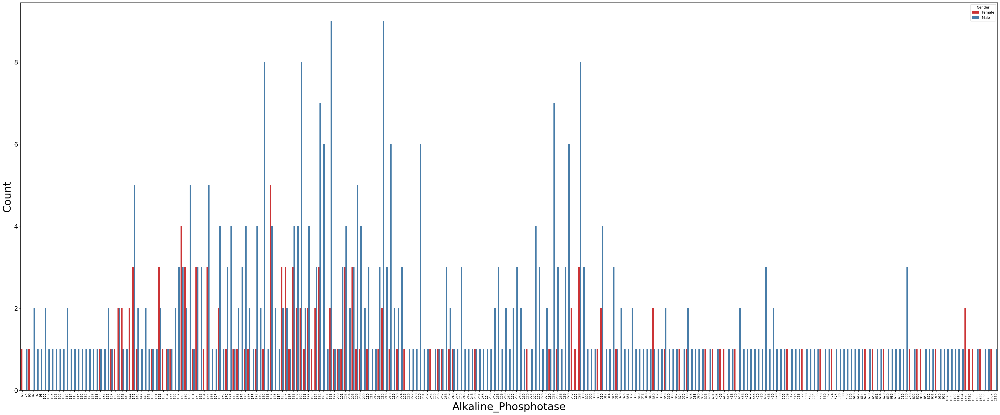

In [41]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Alkaline_Phosphotase",hue='Gender',palette="Set1")
plt.xlabel('Alkaline_Phosphotase', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=9)  
plt.yticks(fontsize=18)  
        
plt.show()

In [42]:
gen_male_alp= data[data["Gender"] == 'Male']
gen_female_alp= data[data["Gender"] == 'Female']

alp_counts_1= gen_male_alp["Alkaline_Phosphotase"].value_counts()
alp_counts_2= gen_female_alp["Alkaline_Phosphotase"].value_counts()

highest_alp_1= alp_counts_1.idxmax()  
highest_count_1_alp = alp_counts_1.max()

highest_alp_2= alp_counts_2.idxmax()
highest_count_2_alp = alp_counts_2.max()

print(f"Alkaline_Phosphotase with highest occurrence (Target=Male): {highest_alp_1} (Count: {highest_count_1_alp})")
print(f"Alkaline_Phosphotase with highest occurrence (Target=Female): {highest_alp_2} (Count: {highest_count_2_alp})")

print('\n')

alp_max=data.groupby(["Gender"])["Alkaline_Phosphotase"].max()
print(alp_max)

Alkaline_Phosphotase with highest occurrence (Target=Male): 215 (Count: 9)
Alkaline_Phosphotase with highest occurrence (Target=Female): 182 (Count: 5)


Gender
Female    1896
Male      2110
Name: Alkaline_Phosphotase, dtype: int64


In [43]:
data[data["Alkaline_Phosphotase"]==2110] # 33 years old male has Alkaline_Phosphotase value of 2110

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
233,33,Male,2.0,1.4,2110,48,89,6.2,3.0,0.9,1


In [44]:
data[data["Alkaline_Phosphotase"]==1896] # 58 years old female has Alkaline_Phosphotase value of 1896

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
128,58,Female,1.7,0.8,1896,61,83,8.0,3.9,0.95,1


#### INSIGHTS

Males → > 800 U/L needs aggressive treatment

Females → > 700 U/L needs aggressive treatment

If ALP exceeds 1200 U/L (males) or 1000 U/L (females), urgent intensive care is required, as it may indicate biliary obstruction, severe liver disease, bone disorders, or metastatic cancer.

In [45]:
len(data[(data["Alkaline_Phosphotase"]>800) & (data["Gender"]=='Male') & (data['Target']==1)])

14

In [46]:
data[(data["Alkaline_Phosphotase"]>800) & (data["Gender"]=='Male') & (data['Target']==2)] # Rare case

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
115,50,Male,7.3,3.6,1580,88,64,5.6,2.3,0.6,2


RARE CASE :  It is most likely this person has a serious liver condition.
While rare bone or blood conditions could mimic this, further tests (GGT, imaging, hemolysis markers) are needed to rule them out.

In [47]:
len(data[(data["Alkaline_Phosphotase"]>700) & (data["Gender"]=='Female')])

10

### ALAMINE AMINOTRANSFERASE (STRONG INDICATOR FOR SEVERE LIVER DISEASE)

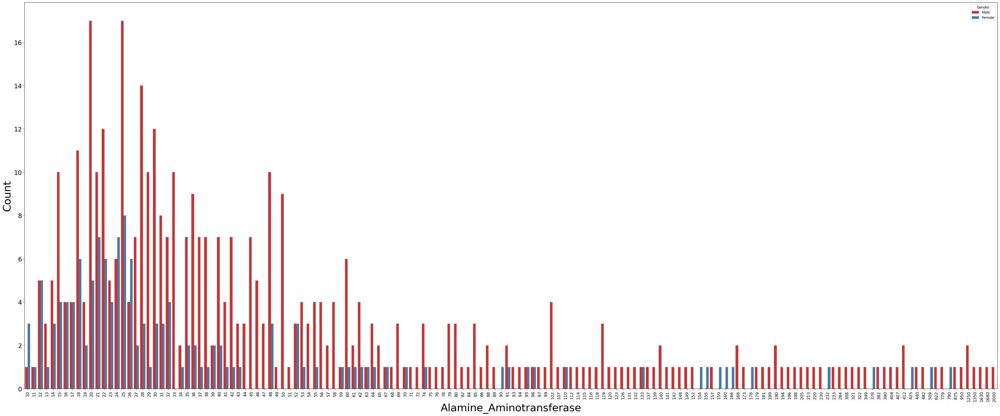

In [48]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Alamine_Aminotransferase",hue='Gender',palette="Set1")
plt.xlabel('Alamine_Aminotransferase', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=12)  
plt.yticks(fontsize=18)  
        
plt.show()

In [49]:
gen_male_alt= data[data["Gender"] == 'Male']
gen_female_alt= data[data["Gender"] == 'Female']

alt_counts_1= gen_male_alt["Alamine_Aminotransferase"].value_counts()
alt_counts_2= gen_female_alt["Alamine_Aminotransferase"].value_counts()

highest_alt_1= alt_counts_1.idxmax()  
highest_count_1_alt = alt_counts_1.max()

highest_alt_2= alt_counts_2.idxmax()
highest_count_2_alt = alt_counts_2.max()

print(f"Alamine_Aminotransferase with highest occurrence (Target=Male): {highest_alt_1} (Count: {highest_count_1_alt})")
print(f"Alamine_Aminotransferase with highest occurrence (Target=Female): {highest_alt_2} (Count: {highest_count_2_alt})")

print('\n')

alt_max=data.groupby(["Gender"])["Alamine_Aminotransferase"].max()
print(alt_max)

Alamine_Aminotransferase with highest occurrence (Target=Male): 20 (Count: 17)
Alamine_Aminotransferase with highest occurrence (Target=Female): 25 (Count: 8)


Gender
Female     790
Male      2000
Name: Alamine_Aminotransferase, dtype: int64


In [50]:
data[data["Alamine_Aminotransferase"]==2000] # 32 years old male has Alamine_Aminotransferase value of 2000

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
117,32,Male,12.7,6.2,194,2000,2946,5.7,3.3,1.3,1


In [51]:
data[data["Alamine_Aminotransferase"]==790] # 7 years old female has Alamine_Aminotransferase value of 790

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
199,7,Female,27.2,11.8,1420,790,1050,6.1,2.0,0.4,1


#### INSIGHTS

Males → > 600 U/L needs aggressive treatment, > 1000 U/L is life-threatening

Females → > 500 U/L needs aggressive treatment, > 800 U/L is life-threatening

If ALT exceeds 1000 U/L (males) or 800 U/L (females), emergency hospitalization and intensive care are needed to prevent acute liver failure.

In [52]:
len(data[(data["Alamine_Aminotransferase"]>600) & (data["Gender"]=='Male')])

10

In [53]:
len(data[(data["Alamine_Aminotransferase"]>500) & (data["Gender"]=='Female')])

2

### ASPARTATE AMINOTRANSFERASE

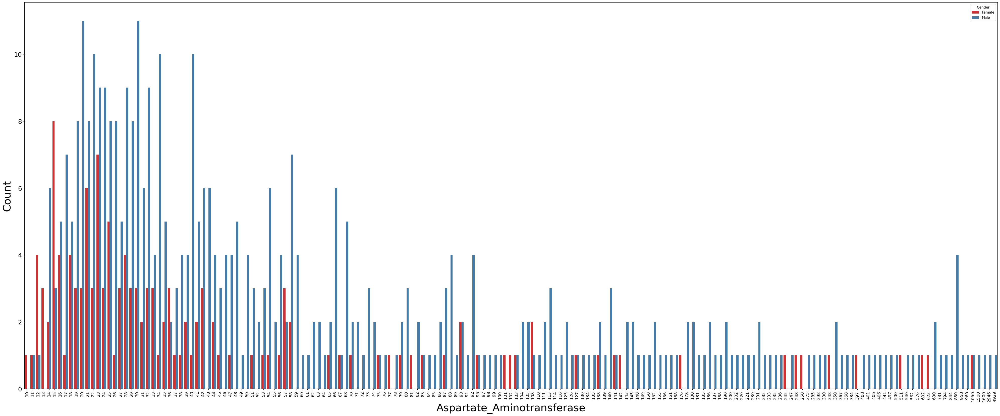

In [54]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Aspartate_Aminotransferase",hue='Gender',palette="Set1")
plt.xlabel('Aspartate_Aminotransferase', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=12)  
plt.yticks(fontsize=18)  
        
plt.show()

In [55]:
gen_male_asp= data[data["Gender"] == 'Male']
gen_female_asp= data[data["Gender"] == 'Female']

asp_counts_1= gen_male_asp["Aspartate_Aminotransferase"].value_counts()
asp_counts_2= gen_female_asp["Aspartate_Aminotransferase"].value_counts()

highest_asp_1= asp_counts_1.idxmax()  
highest_count_1_asp = asp_counts_1.max()

highest_asp_2= asp_counts_2.idxmax()
highest_count_2_asp = asp_counts_2.max()

print(f"Aspartate_Aminotransferase with highest occurrence (Target=Male): {highest_asp_1} (Count: {highest_count_1_asp})")
print(f"Aspartate_Aminotransferase with highest occurrence (Target=Female): {highest_asp_2} (Count: {highest_count_2_asp})")

print('\n')

asp_max=data.groupby(["Gender"])["Aspartate_Aminotransferase"].max()
print(asp_max)

Aspartate_Aminotransferase with highest occurrence (Target=Male): 30 (Count: 11)
Aspartate_Aminotransferase with highest occurrence (Target=Female): 15 (Count: 8)


Gender
Female    1050
Male      4929
Name: Aspartate_Aminotransferase, dtype: int64


In [56]:
data[data["Aspartate_Aminotransferase"]==4929] # 66 years old male with Aspartate_Aminotransferase 4929

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
135,66,Male,11.3,5.6,1110,1250,4929,7.0,2.4,0.5,1


In [57]:
data[(data["Aspartate_Aminotransferase"]==1050) & (data["Gender"]=='Female')] # 7 years old female with Aspartate_Aminotransferase 1050.
# this female is already in alt severe case

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
199,7,Female,27.2,11.8,1420,790,1050,6.1,2.0,0.4,1


#### INSIGHTS

Males → > 500 U/Lneeds aggressive treatment, > 900 U/L is life-threatening

Females → > 400 U/L needs aggressive treatment, > 700 U/L is life-threatening

If AST exceeds 1000 U/L (males) or 800 U/L (females), emergency hospitalization and intensive care are needed to prevent acute liver or multi-organ failure.

In [58]:
len(data[(data["Aspartate_Aminotransferase"]>500) & (data["Gender"]=='Male')])

19

In [59]:
len(data[(data["Aspartate_Aminotransferase"]>400) & (data["Gender"]=='Female')])

4

### TOTAL PROTEINS

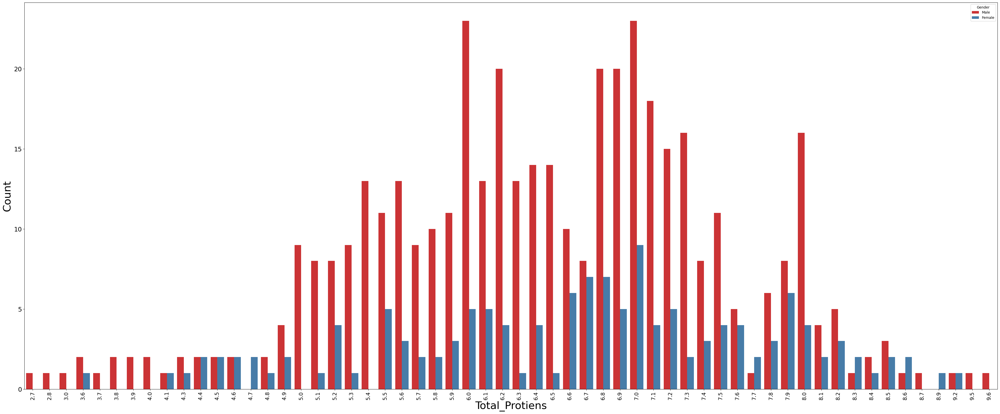

In [60]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Total_Protiens",hue='Gender',palette="Set1")
plt.xlabel('Total_Protiens', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=15)  
plt.yticks(fontsize=18)  
        
plt.show()

In [61]:

gen_male_totp= data[data["Gender"] == 'Male']
gen_female_totp= data[data["Gender"] == 'Female']

totp_counts_1= gen_male_totp["Total_Protiens"].value_counts()
totp_counts_2= gen_female_totp["Total_Protiens"].value_counts()

highest_totp_1= totp_counts_1.idxmax()  
highest_count_1_totp = totp_counts_1.max()

highest_totp_2= totp_counts_2.idxmax()
highest_count_2_totp = totp_counts_2.max()

print(f"Total_Protiens with highest occurrence (Target=Male): {highest_totp_1} (Count: {highest_count_1_totp})")
print(f"Total_Protiens with highest occurrence (Target=Female): {highest_totp_2} (Count: {highest_count_2_totp})")

print('\n')

totp_max=data.groupby(["Gender"])["Total_Protiens"].min()
print(totp_max)

Total_Protiens with highest occurrence (Target=Male): 6.0 (Count: 23)
Total_Protiens with highest occurrence (Target=Female): 7.0 (Count: 9)


Gender
Female    3.6
Male      2.7
Name: Total_Protiens, dtype: float64


In [62]:
data[data["Total_Protiens"]==2.7] # 75 years old male with Total_Protiens 2.7

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
180,75,Male,2.8,1.3,250,23,29,2.7,0.9,0.5,1


In [63]:
data[(data["Total_Protiens"]==3.6) & (data["Gender"]=='Female')] # 46 years old female with Total_Protiens 3.6

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
533,46,Female,1.4,0.4,298,509,623,3.6,1.0,0.3,1


#### INSIGHTS

Males → < 4.5 g/dL needs aggressive treatment, < 4.0 g/dL is life-threatening

Females → < 4.3 g/dL needs aggressive treatment, < 3.8 g/dL is life-threatening

 If total protein drops below these critical levels, hospitalization and urgent treatment (IV albumin, protein supplements, underlying disease management) are required to prevent organ failure.


In [64]:
len(data[(data["Total_Protiens"]<4.0) & (data["Gender"]=='Male')& (data['Target']==1)]) 

6

In [65]:
len(data[(data["Total_Protiens"]<4.0) & (data["Gender"]=='Male')& (data['Target']==2)])  

4

In [66]:
len(data[(data["Total_Protiens"]<3.8) & (data["Gender"]=='Female')])

1

### ALBUMIN

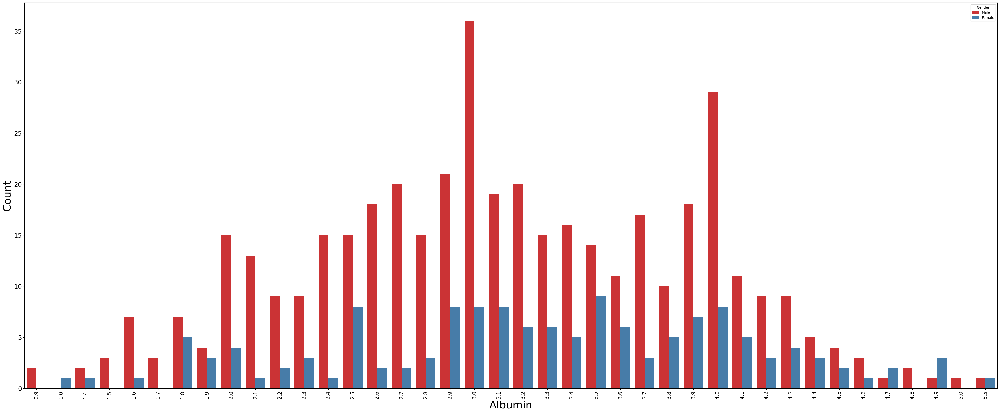

In [67]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Albumin",hue='Gender',palette="Set1")
plt.xlabel('Albumin', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=15)  
plt.yticks(fontsize=18)  
        
plt.show()

In [68]:

gen_male_alb= data[data["Gender"] == 'Male']
gen_female_alb= data[data["Gender"] == 'Female']

alb_counts_1= gen_male_alb["Albumin"].value_counts()
alb_counts_2= gen_female_alb["Albumin"].value_counts()

highest_alb_1= alb_counts_1.idxmax()  
highest_count_1_alb = alb_counts_1.max()

highest_alb_2= alb_counts_2.idxmax()
highest_count_2_alb = alb_counts_2.max()

print(f"Albumin with highest occurrence (Target=Male): {highest_alb_1} (Count: {highest_count_1_alb})")
print(f"Albumin with highest occurrence (Target=Female): {highest_alb_2} (Count: {highest_count_2_alb})")

print('\n')

alb_max=data.groupby(["Gender"])["Albumin"].min()
print(alb_max)

Albumin with highest occurrence (Target=Male): 3.0 (Count: 36)
Albumin with highest occurrence (Target=Female): 3.5 (Count: 9)


Gender
Female    1.0
Male      0.9
Name: Albumin, dtype: float64


In [69]:
data[data["Albumin"]==1.0] # 46 years old female has Albumin value of 1.0

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
533,46,Female,1.4,0.4,298,509,623,3.6,1.0,0.3,1


In [70]:
data[data["Albumin"]==0.9] # 26 and 75 years old male has Albumin of 0.9

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
180,75,Male,2.8,1.3,250,23,29,2.7,0.9,0.5,1
458,26,Male,6.8,3.2,140,37,19,3.6,0.9,0.3,1


#### INSIGHT

Males → < 2.0 g/dL needs aggressive treatment, < 1.5 g/dL is life-threatening

Females → < 1.8 g/dL needs aggressive treatment, < 1.4 g/dL is life-threatening

If albumin drops below these critical levels, immediate hospitalization and urgent treatment (IV albumin infusion, nutritional support, liver/kidney disease management) are required to prevent multi-organ failure.

In [71]:
len(data[(data["Albumin"]<2.0) & (data["Gender"]=='Male')& (data['Target']==1)])

22

In [72]:
len(data[(data["Albumin"]<2.0) & (data["Gender"]=='Male')& (data['Target']==2)])

6

In [73]:
len(data[(data["Albumin"]<1.8) & (data["Gender"]=='Female')& (data['Target']==1)])

2

In [74]:
len(data[(data["Albumin"]<1.8) & (data["Gender"]=='Female')& (data['Target']==2)])

1

### ALBUMIN AND GLOBULIN RATIO

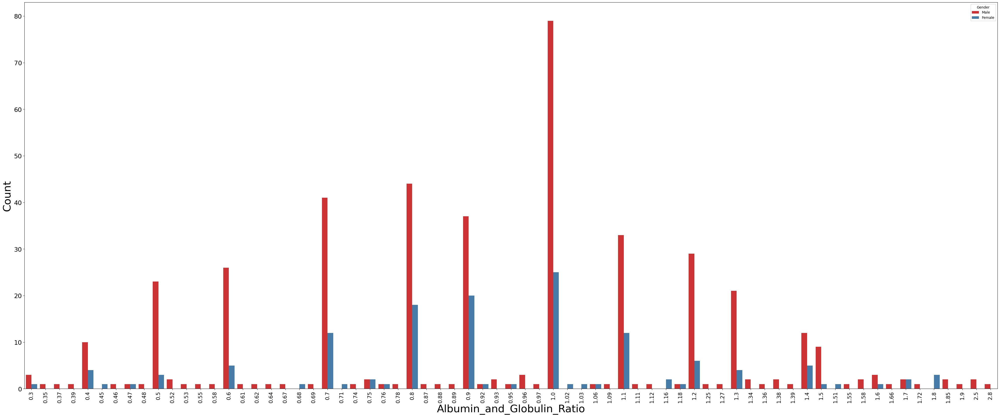

In [75]:
plt.figure(figsize=(50,20))
sns.countplot(data,x="Albumin_and_Globulin_Ratio",hue='Gender',palette="Set1")
plt.xlabel('Albumin_and_Globulin_Ratio', fontsize=30)
plt.ylabel("Count", fontsize=30)
plt.xticks(rotation=90, fontsize=15)  
plt.yticks(fontsize=18)  
        
plt.show()

In [76]:
gen_male_albgr= data[data["Gender"] == 'Male']
gen_female_albgr= data[data["Gender"] == 'Female']

albgr_counts_1= gen_male_albgr["Albumin_and_Globulin_Ratio"].value_counts()
albgr_counts_2= gen_female_albgr["Albumin_and_Globulin_Ratio"].value_counts()

highest_albgr_1= albgr_counts_1.idxmax()  
highest_count_1_albgr = albgr_counts_1.max()

highest_albgr_2= albgr_counts_2.idxmax()
highest_count_2_albgr = albgr_counts_2.max()

print(f"Albumin_and_Globulin_Ratio with highest occurrence (Target=Male): {highest_albgr_1} (Count: {highest_count_1_albgr})")
print(f"Albumin_and_Globulin_Ratio with highest occurrence (Target=Female): {highest_albgr_2} (Count: {highest_count_2_albgr})")

print('\n')

albgr_max=data.groupby(["Gender"])["Albumin_and_Globulin_Ratio"].min()
print(albgr_max)

Albumin_and_Globulin_Ratio with highest occurrence (Target=Male): 1.0 (Count: 79)
Albumin_and_Globulin_Ratio with highest occurrence (Target=Female): 1.0 (Count: 25)


Gender
Female    0.3
Male      0.3
Name: Albumin_and_Globulin_Ratio, dtype: float64


In [77]:
data[data["Albumin_and_Globulin_Ratio"]==0.3] #35,26,50 years old male and 46 years old female both have Albumin_and_Globulin_Ratio of 0.3

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
401,50,Male,7.3,3.7,92,44,236,6.8,1.6,0.3,1
458,26,Male,6.8,3.2,140,37,19,3.6,0.9,0.3,1
519,35,Male,26.3,12.1,108,168,630,9.2,2.0,0.3,1
533,46,Female,1.4,0.4,298,509,623,3.6,1.0,0.3,1


#### INSIGHTS

Males → < 0.5 needs aggressive treatment, < 0.3 is life-threatening

Females → < 0.4 needs aggressive treatment, < 0.2 is life-threatening

If A/G ratio drops to critical levels, urgent hospitalization, IV albumin, dialysis (if kidney-related), or liver support is needed to prevent fatal complications.

In [78]:
len(data[(data["Albumin_and_Globulin_Ratio"]<0.5) & (data["Gender"]=='Male')& (data['Target']==1)])

18

In [79]:
len(data[(data["Albumin_and_Globulin_Ratio"]<0.5) & (data["Gender"]=='Male')& (data['Target']==2)])

1

In [80]:
len(data[(data["Albumin_and_Globulin_Ratio"]<0.4) & (data["Gender"]=='Female')])

1

## 4.5. CREATION OF DATAFRAME FOR PEOPLE IN CRITICAL CONDITION

In [81]:
tot_bil_male=data[(data["Total_Bilirubin"]>25) & (data["Gender"]=='Male')]
tot_bil_fem=data[(data["Total_Bilirubin"]>20) & (data["Gender"]=='Female')]
dir_bil_male=data[(data["Direct_Bilirubin"]>6) & (data["Gender"]=='Male')]
dir_bil_fem=data[(data["Direct_Bilirubin"]>5) & (data["Gender"]=='Female')]
alp_male=data[(data["Alkaline_Phosphotase"]>800) & (data["Gender"]=='Male') & (data['Target']==1)]
alp_fem=data[(data["Alkaline_Phosphotase"]>700) & (data["Gender"]=='Female')]
alt_male=data[(data["Alamine_Aminotransferase"]>600) & (data["Gender"]=='Male')]
alt_fem=data[(data["Alamine_Aminotransferase"]>500) & (data["Gender"]=='Female')]
ast_male=data[(data["Aspartate_Aminotransferase"]>500) & (data["Gender"]=='Male')]
ast_fem=data[(data["Aspartate_Aminotransferase"]>400) & (data["Gender"]=='Female')]
tp_male=data[(data["Total_Protiens"]<4.0) & (data["Gender"]=='Male')& (data['Target']==1)]
tp_fem=data[(data["Total_Protiens"]<3.8) & (data["Gender"]=='Female')]
alb_male=data[(data["Albumin"]<2.0) & (data["Gender"]=='Male')& (data['Target']==1)]
alb_fem=data[(data["Albumin"]<1.8) & (data["Gender"]=='Female')& (data['Target']==1)]
agratio_male=data[(data["Albumin_and_Globulin_Ratio"]<0.5) & (data["Gender"]=='Male')& (data['Target']==1)]
agratio_fem=data[(data["Albumin_and_Globulin_Ratio"]<0.4) & (data["Gender"]=='Female')]

In [82]:
critic_df = pd.concat([tot_bil_male, tot_bil_fem, dir_bil_male, dir_bil_fem, alp_male, alp_fem, alt_male, alt_fem, ast_male, ast_fem,
    tp_male, tp_fem, alb_male, alb_fem, agratio_male, agratio_fem])
critic_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
166,55,Male,75.0,3.6,332,40,66,6.2,2.5,0.60,1
259,42,Male,30.5,14.2,285,65,130,5.2,2.1,0.60,1
504,32,Male,30.5,17.1,218,39,79,5.5,2.7,0.90,1
505,32,Male,32.6,14.1,219,95,235,5.8,3.1,1.10,1
519,35,Male,26.3,12.1,108,168,630,9.2,2.0,0.30,1
...,...,...,...,...,...,...,...,...,...,...,...
561,66,Male,16.6,7.6,315,233,384,6.9,2.0,0.40,1
565,43,Male,22.5,11.8,143,22,143,6.6,2.1,0.46,1
567,52,Male,2.7,1.4,251,20,40,6.0,1.7,0.39,1
573,32,Male,3.7,1.6,612,50,88,6.2,1.9,0.40,1


In [83]:
crit_dup=critic_df[critic_df.duplicated()]
crit_dup

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
259,42,Male,30.5,14.2,285,65,130,5.2,2.1,0.60,1
504,32,Male,30.5,17.1,218,39,79,5.5,2.7,0.90,1
505,32,Male,32.6,14.1,219,95,235,5.8,3.1,1.10,1
519,35,Male,26.3,12.1,108,168,630,9.2,2.0,0.30,1
531,40,Male,30.8,18.3,285,110,186,7.9,2.7,0.50,1
...,...,...,...,...,...,...,...,...,...,...,...
561,66,Male,16.6,7.6,315,233,384,6.9,2.0,0.40,1
565,43,Male,22.5,11.8,143,22,143,6.6,2.1,0.46,1
567,52,Male,2.7,1.4,251,20,40,6.0,1.7,0.39,1
573,32,Male,3.7,1.6,612,50,88,6.2,1.9,0.40,1


In [84]:
critic_df.drop_duplicates(inplace=True)

In [85]:
critic_df

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Target
166,55,Male,75.0,3.6,332,40,66,6.2,2.5,0.6,1
259,42,Male,30.5,14.2,285,65,130,5.2,2.1,0.6,1
504,32,Male,30.5,17.1,218,39,79,5.5,2.7,0.9,1
505,32,Male,32.6,14.1,219,95,235,5.8,3.1,1.1,1
519,35,Male,26.3,12.1,108,168,630,9.2,2.0,0.3,1
...,...,...,...,...,...,...,...,...,...,...,...
573,32,Male,3.7,1.6,612,50,88,6.2,1.9,0.4,1
79,58,Female,2.8,1.3,670,48,79,4.7,1.6,0.5,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.4,1
306,48,Male,1.6,1.0,588,74,113,7.3,2.4,0.4,1


### INSIGHTS FROM EDA


1. The dataset contains more males (430) than females (140), and the number of individuals with liver disease (406) is greater than those without it (164). The number of females with liver disease (91) is less than the number of males without liver disease (115).
   
2. Out of 430 males, 315 (73.26%) have liver disease, while 115 (26.74%) do not. Among 140 females, 91 (65%) have liver disease, whereas 49 (35%) do not. Overall, 55.26% of the total population are males with liver disease, and 15.96% are females with liver disease, making up a total of 71.22% (406 individuals). Similarly, 20.18% of the total population are males without liver disease, and 8.6% are females without liver disease, totaling 28.78% (164 individuals).
   
3. A total of 101 individuals in the dataset are suffering from liver disease, showing critically elevated or severely reduced liver function markers. These individuals require urgent medical intervention, including intensive care, hospitalization, and targeted treatments to prevent life-threatening complications such as liver failure, bile obstruction, or multi-organ dysfunction.

# 5. DATA PREPROCESSING

## 5.1. CHECKING NULL VALUES 

In [86]:
data.isnull().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    4
Target                        0
dtype: int64

In [87]:
# Handling null values
data['Albumin_and_Globulin_Ratio']=data['Albumin_and_Globulin_Ratio'].fillna(data['Albumin_and_Globulin_Ratio'].median())

# Since the Albumin_and_Globulin_Ratio column is skewed, we use median to replace null values.

In [88]:
# Verification
data.isnull().sum()

Age                           0
Gender                        0
Total_Bilirubin               0
Direct_Bilirubin              0
Alkaline_Phosphotase          0
Alamine_Aminotransferase      0
Aspartate_Aminotransferase    0
Total_Protiens                0
Albumin                       0
Albumin_and_Globulin_Ratio    0
Target                        0
dtype: int64

## 5.2. CHECKING CORRUPTED VALUES

In [89]:
cor_val=['Age', 'Total_Bilirubin', 'Direct_Bilirubin', 'Alkaline_Phosphotase', 'Alamine_Aminotransferase','Aspartate_Aminotransferase',
         'Total_Protiens', 'Albumin', 'Albumin_and_Globulin_Ratio']

for i in cor_val:
    if (data[i]==0).any():
         print(f'{i}: There are corrupted values in the column\n')
    else:
        print(f'{i}: There are no corrupted values in the column\n') 

Age: There are no corrupted values in the column

Total_Bilirubin: There are no corrupted values in the column

Direct_Bilirubin: There are no corrupted values in the column

Alkaline_Phosphotase: There are no corrupted values in the column

Alamine_Aminotransferase: There are no corrupted values in the column

Aspartate_Aminotransferase: There are no corrupted values in the column

Total_Protiens: There are no corrupted values in the column

Albumin: There are no corrupted values in the column

Albumin_and_Globulin_Ratio: There are no corrupted values in the column



## 5.3. CORRELATION 

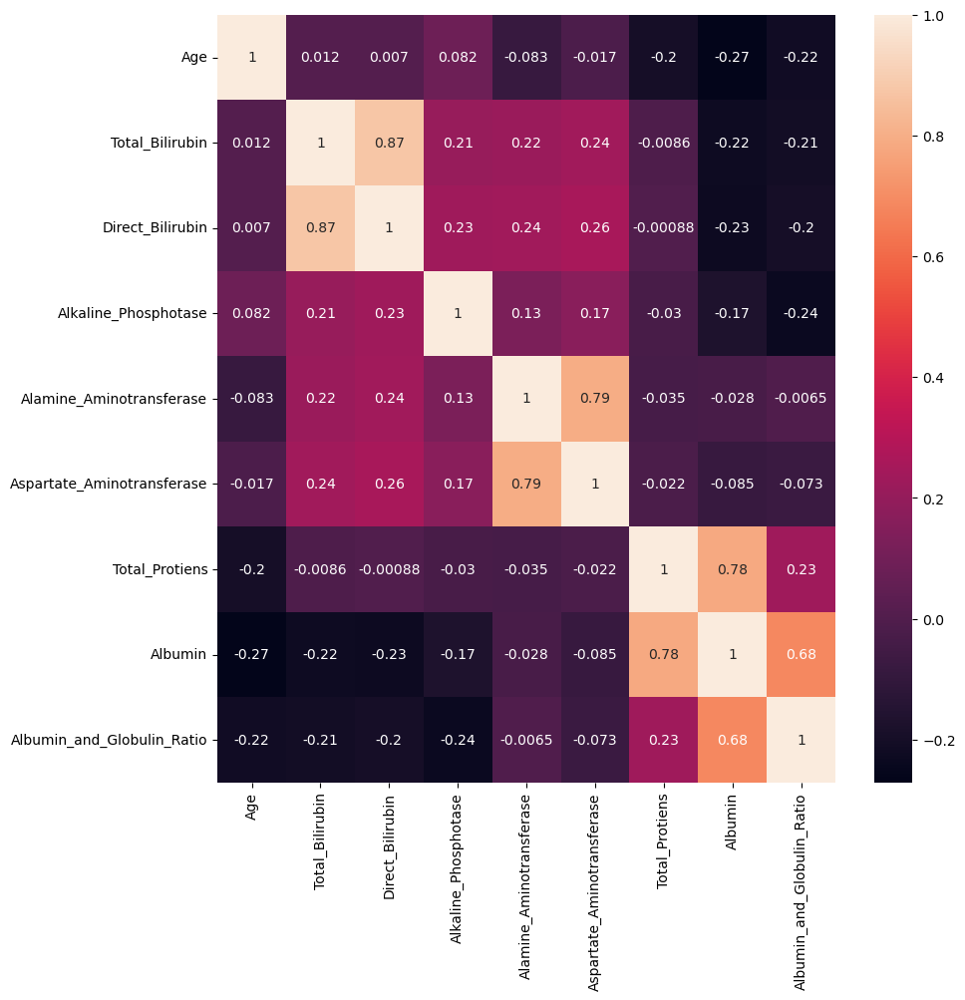

In [90]:
# Check for correlation to avoid multicollinearity
numer=data.select_dtypes(include=['int','float'])
plt.figure(figsize=(10,10))
sns.heatmap(data=numer.iloc[:,:-1].corr(),annot=True)
plt.show()

In [91]:
numer.iloc[:,:-1].corr()

,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
Age,1.000000,0.011500,0.007050,0.081673,-0.083383,-0.016753,-0.197052,-0.271170,-0.215654
Total_Bilirubin,0.011500,1.000000,0.874116,0.206239,0.217471,0.238678,-0.008588,-0.224124,-0.207646
Direct_Bilirubin,0.007050,0.874116,1.000000,0.234609,0.237450,0.258489,-0.000875,-0.230751,-0.201412
Alkaline_Phosphotase,0.081673,0.206239,0.234609,1.000000,0.126830,0.167230,-0.030048,-0.168318,-0.236058
Alamine_Aminotransferase,-0.083383,0.217471,0.237450,0.126830,1.000000,0.791857,-0.035193,-0.027973,-0.006537
Aspartate_Aminotransferase,-0.016753,0.238678,0.258489,0.167230,0.791857,1.000000,-0.022000,-0.085180,-0.072893
Total_Protiens,-0.197052,-0.008588,-0.000875,-0.030048,-0.035193,-0.022000,1.000000,0.784731,0.233588
Albumin,-0.271170,-0.224124,-0.230751,-0.168318,-0.027973,-0.085180,0.784731,1.000000,0.684126
Albumin_and_Globulin_Ratio,-0.215654,-0.207646,-0.201412,-0.236058,-0.006537,-0.072893,0.233588,0.684126,1.000000


In [93]:
# Removing the columns which have correlation value more than the limit to avoid multicollinearity (Assuming 0.75 as limit) 
data.drop(["Direct_Bilirubin","Aspartate_Aminotransferase", "Total_Protiens"],axis=1,inplace=True)

#### INSIGHTS
--> Total-Bilirubin is a summation of Direct and Indirect Bilirubin, so Direct-Bilirubin is removed [Correlation: 0.874116]

--> Alamine_Aminotransferase is a strong indicator of liver disease severity compared with Aspartate_Aminotransferase(AST), so AST is removed [Correlation: 0.791857]

--> Total-Proteins is dropped and Albumin is kept, as it is more specific to liver function and liver disease severity [Correlation: 0.784731]

## 5.4. HANDLING THE OUTLIERS

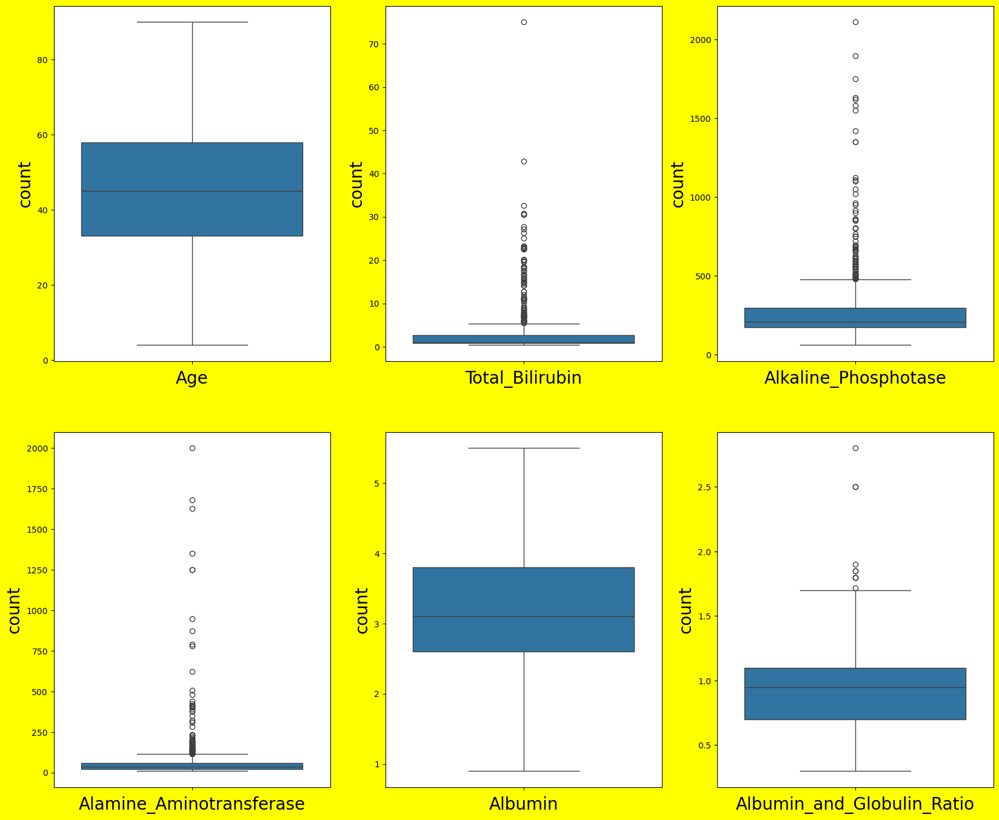

In [94]:
numout=data.select_dtypes(exclude="O").iloc[:,:-1]
plt.figure(figsize=(20,35),facecolor='yellow')
plotnumber=1
for i in numout.columns:
    if plotnumber<=11:
        ax=plt.subplot(4,3,plotnumber)
        sns.boxplot(numout[i])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.show()

In [95]:
# Handling the outliers

from scipy.stats.mstats import winsorize

winsor_limits = {'Total_Bilirubin': (0, 0.15),  
                 'Alkaline_Phosphotase': (0, 0.13), 
                 'Alamine_Aminotransferase': (0, 0.13), 
                 'Albumin_and_Globulin_Ratio': (0,0.02)}

for col, lim in winsor_limits.items():
    data[col] = winsorize(data[col], limits=lim)

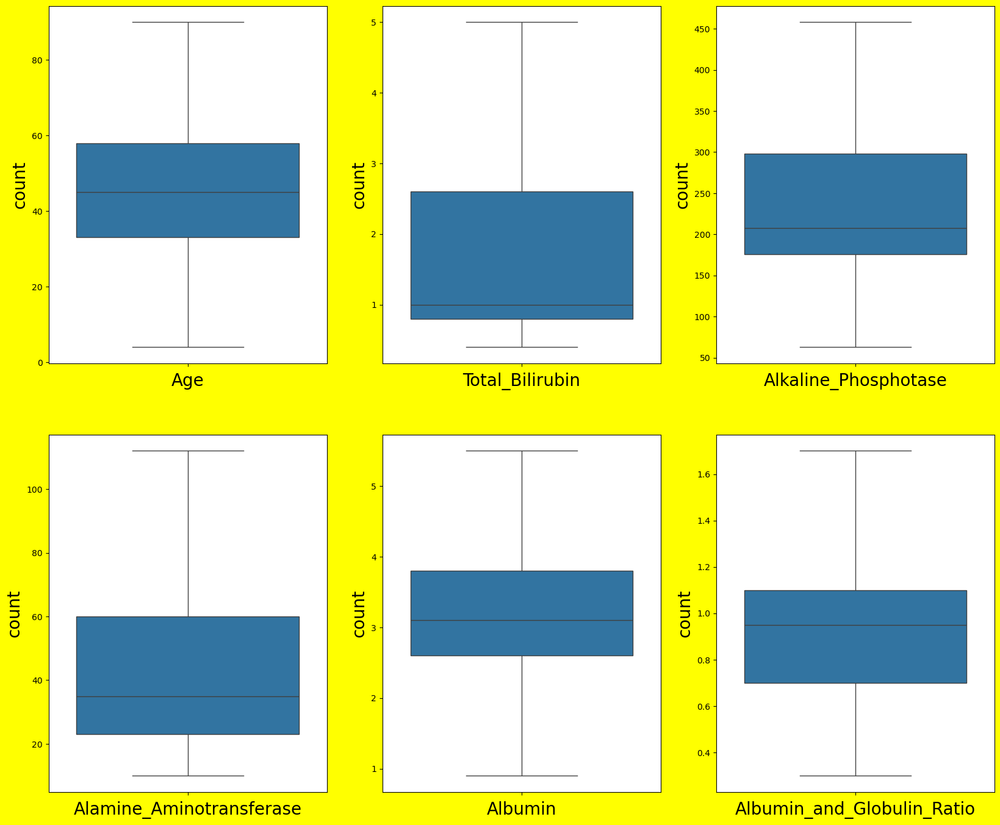

In [96]:
# Verifying

numout=data.select_dtypes(exclude="O").iloc[:,:-1]
plt.figure(figsize=(20,35),facecolor='yellow')
plotnumber=1
for i in numout.columns:
    if plotnumber<=11:
        ax=plt.subplot(4,3,plotnumber)
        sns.boxplot(numout[i])
        plt.xlabel(i,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber=plotnumber+1

plt.show()

## 5.5. ENCODING CATEGORICAL COLUMN

### GENDER

In [97]:
ohe_gen = OneHotEncoder()

In [98]:
gen_encoded = ohe_gen.fit_transform(data[['Gender']]).toarray()
gen_encoded

array([[1., 0.],
       [0., 1.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [99]:
ohe_gen.get_feature_names_out()

array(['Gender_Female', 'Gender_Male'], dtype=object)

In [100]:
gen_encoded_df = pd.DataFrame(gen_encoded.astype(int), index=data.index, columns=['Gender_Female', 'Gender_Male'])
gen_encoded_df

,Gender_Female,Gender_Male
0,1,0
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
578,0,1
579,0,1
580,0,1
581,0,1


In [101]:
gen_encoded_df.drop('Gender_Female',axis=1,inplace=True)
gen_encoded_df

,Gender_Male
0,0
1,1
2,1
3,1
4,1
...,...
578,1
579,1
580,1
581,1


In [102]:
data = pd.concat([gen_encoded_df,data],axis=1)
data

,Gender_Male,Age,Gender,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,65,Female,0.7,187,16,3.3,0.90,1
1,1,62,Male,5.0,458,64,3.2,0.74,1
2,1,62,Male,5.0,458,60,3.3,0.89,1
3,1,58,Male,1.0,182,14,3.4,1.00,1
4,1,72,Male,3.9,195,27,2.4,0.40,1
...,...,...,...,...,...,...,...,...,...
578,1,60,Male,0.5,458,20,1.6,0.37,2
579,1,40,Male,0.6,98,35,3.2,1.10,1
580,1,52,Male,0.8,245,48,3.2,1.00,1
581,1,31,Male,1.3,184,29,3.4,1.00,1


In [103]:
data.drop("Gender",axis=1,inplace=True)
data

,Gender_Male,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,65,0.7,187,16,3.3,0.90,1
1,1,62,5.0,458,64,3.2,0.74,1
2,1,62,5.0,458,60,3.3,0.89,1
3,1,58,1.0,182,14,3.4,1.00,1
4,1,72,3.9,195,27,2.4,0.40,1
...,...,...,...,...,...,...,...,...
578,1,60,0.5,458,20,1.6,0.37,2
579,1,40,0.6,98,35,3.2,1.10,1
580,1,52,0.8,245,48,3.2,1.00,1
581,1,31,1.3,184,29,3.4,1.00,1


## 5.6. SCALING FOR NUMERICAL COLUMNS

In [104]:
min_max = MinMaxScaler()

In [105]:
data.iloc[:,1:-1] = min_max.fit_transform(data.iloc[:,1:-1])

In [106]:
data

,Gender_Male,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio,Target
0,0,0.709302,0.065217,0.313924,0.058824,0.521739,0.428571,1
1,1,0.674419,1.000000,1.000000,0.529412,0.500000,0.314286,1
2,1,0.674419,1.000000,1.000000,0.490196,0.521739,0.421429,1
3,1,0.627907,0.130435,0.301266,0.039216,0.543478,0.500000,1
4,1,0.790698,0.760870,0.334177,0.166667,0.326087,0.071429,1
...,...,...,...,...,...,...,...,...
578,1,0.651163,0.021739,1.000000,0.098039,0.152174,0.050000,2
579,1,0.418605,0.043478,0.088608,0.245098,0.500000,0.571429,1
580,1,0.558140,0.086957,0.460759,0.372549,0.500000,0.500000,1
581,1,0.313953,0.195652,0.306329,0.186275,0.543478,0.500000,1


## 5.7. CLASS IMBALANCE CHECKING

In [107]:
class_counts=data["Target"].value_counts()
class_counts

Target
1    406
2    164
Name: count, dtype: int64

In [108]:
imbalance_ratio = class_counts.max() / class_counts.min()
imbalance_ratio

2.475609756097561

#### The ratio 2.475 is considered as a moderate imbalance and the model performance can be good without applying SMOTE

# 6. DATA SPLITTING

In [109]:
x = data.iloc[:,:-1] # Independent variables
x

,Gender_Male,Age,Total_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Albumin,Albumin_and_Globulin_Ratio
0,0,0.709302,0.065217,0.313924,0.058824,0.521739,0.428571
1,1,0.674419,1.000000,1.000000,0.529412,0.500000,0.314286
2,1,0.674419,1.000000,1.000000,0.490196,0.521739,0.421429
3,1,0.627907,0.130435,0.301266,0.039216,0.543478,0.500000
4,1,0.790698,0.760870,0.334177,0.166667,0.326087,0.071429
...,...,...,...,...,...,...,...
578,1,0.651163,0.021739,1.000000,0.098039,0.152174,0.050000
579,1,0.418605,0.043478,0.088608,0.245098,0.500000,0.571429
580,1,0.558140,0.086957,0.460759,0.372549,0.500000,0.500000
581,1,0.313953,0.195652,0.306329,0.186275,0.543478,0.500000


In [110]:
y = data.iloc[:,-1] # Target variable
y

0      1
1      1
2      1
3      1
4      1
      ..
578    2
579    1
580    1
581    1
582    2
Name: Target, Length: 570, dtype: int64

In [111]:
x_train, x_test, y_train, y_test = train_test_split(x,y,train_size = 0.8, random_state = 18)

In [112]:
x_train.shape

(456, 7)

In [113]:
x_test.shape

(114, 7)

In [114]:
y_train.shape

(456,)

In [115]:
y_test.shape

(114,)

# 7. MODEL CREATION

## 7.1. LOGISTIC REGRESSION

In [184]:
lg_model=LogisticRegression()

lg_model.fit(x_train,y_train)

ypredlg=lg_model.predict(x_test)

print(classification_report(y_test,ypredlg))

              precision    recall  f1-score   support

           1       0.80      0.96      0.87        90
           2       0.33      0.08      0.13        24

    accuracy                           0.77       114
   macro avg       0.56      0.52      0.50       114
weighted avg       0.70      0.77      0.71       114



In [185]:
print('The F1 score (Logistic Regression) is ',f1_score(y_test,ypredlg))

pd.crosstab(y_test,ypredlg)

The F1 score (Logistic Regression) is  0.8686868686868687


col_0,1,2
Target,,
1,86,4
2,22,2


### 7.1.1. HYPERPARAMETER TUNING (LOGISTIC REGRESSION)

In [193]:
model_htt=LogisticRegression()


lgparams={'penalty' : ['l1', 'l2', 'elasticnet'],
        'fit_intercept':[True,False],
        'max_iter': [100, 200, 500, 1000],
        'solver' : ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
       }


logistic_cv=RandomizedSearchCV(estimator=model_htt,
                        param_distributions=lgparams,
                        scoring='f1',
                        n_jobs=-1,
                        verbose=3)


logistic_cv.fit(x_train,y_train)


Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'fit_intercept': [True, False],
                                        'max_iter': [100, 200, 500, 1000],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['lbfgs', 'liblinear',
                                                   'newton-cg',
                                                   'newton-cholesky', 'sag',
                                                   'saga']},
                   scoring='f1', verbose=3)

In [194]:
lg_best_params=logistic_cv.best_params_

In [195]:
print(f'best parameters:{lg_best_params}')

best parameters:{'solver': 'newton-cholesky', 'penalty': 'l2', 'max_iter': 500, 'fit_intercept': False}


In [196]:
lgg1=LogisticRegression(solver='newton-cholesky',penalty="l2",fit_intercept=False, max_iter=500) 
lgg1.fit(x_train,y_train)
ypredlogi=lgg1.predict(x_test)
logistic_reg_f1=f1_score(y_test,ypredlogi) 
print(logistic_reg_f1)

0.8800000000000001


## 7.2. DECISION TREE

In [197]:
dt_model=DecisionTreeClassifier()
dt_model.fit(x_train,y_train)
y_pred_dt=dt_model.predict(x_test)
print(f' dt_f1_score: {f1_score(y_test,y_pred_dt)}\n')
print(confusion_matrix(y_test,y_pred_dt))
print(classification_report(y_test,y_pred_dt))

 dt_f1_score: 0.8255813953488372

[[71 19]
 [11 13]]
              precision    recall  f1-score   support

           1       0.87      0.79      0.83        90
           2       0.41      0.54      0.46        24

    accuracy                           0.74       114
   macro avg       0.64      0.67      0.64       114
weighted avg       0.77      0.74      0.75       114



### 7.2.1. HYPERPARAMETER TUNING (DECISION TREE)

In [208]:
dett_params={'criterion':['gini','entropy','log_loss'],
           'splitter':['best','random'],
           'max_depth':[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
           'min_samples_split':list(range(1,20)),      
           'min_samples_leaf':list(range(1,20)),
            'max_features': ['sqrt', 'log2'],  
            'max_leaf_nodes': [10, 20, 50, 100]  
           }

treeclf=DecisionTreeClassifier()
treecv=RandomizedSearchCV(treeclf,param_distributions=dett_params,scoring='f1',n_jobs=-1,verbose=3,cv=5)
treecv.fit(x_train,y_train)
det_best_params=treecv.best_params_
print(f'best parameters:{det_best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best parameters:{'splitter': 'random', 'min_samples_split': 17, 'min_samples_leaf': 6, 'max_leaf_nodes': 10, 'max_features': 'sqrt', 'max_depth': 11, 'criterion': 'log_loss'}


In [209]:
dtek=DecisionTreeClassifier(splitter='random', min_samples_split=17, min_samples_leaf=6, max_leaf_nodes=10,
                            max_features='sqrt', max_depth=11, criterion='log_loss') 
dtek.fit(x_train,y_train)
y_pred_ddt=dtek.predict(x_test)
decisiontree_f1=f1_score(y_test,y_pred_ddt)
print(decisiontree_f1)

0.8770053475935828


## 7.3. RANDOM FOREST

In [210]:
rf_model=RandomForestClassifier()
rf_model.fit(x_train,y_train)
y_pred_rf=rf_model.predict(x_test)
print(f' rf_f1_score :{f1_score(y_test,y_pred_rf)}\n')
print(confusion_matrix(y_test,y_pred_rf))
print(classification_report(y_test,y_pred_rf))

 rf_f1_score :0.8494623655913979

[[79 11]
 [17  7]]
              precision    recall  f1-score   support

           1       0.82      0.88      0.85        90
           2       0.39      0.29      0.33        24

    accuracy                           0.75       114
   macro avg       0.61      0.58      0.59       114
weighted avg       0.73      0.75      0.74       114



### 7.3.1. HYPERPARAMETER TUNING (RANDOM FOREST)

In [213]:
rad_grid={
    'n_estimators': [50,100,150,200,250,300,350,400,450,500], 
    'criterion': ['gini', 'entropy', 'log_loss'],  
    'max_depth': list(range(1,51)), 
    'min_samples_split': list(range(1,30)), 
    'min_samples_leaf': list(range(1,30)),  
    'max_features': ['sqrt', 'log2', None],  
    'bootstrap': [True, False], 
    'oob_score': [True, False],  
    'class_weight': [None, 'balanced'],  
}

rf_clf=RandomForestClassifier()
rf_cv=RandomizedSearchCV(estimator=rf_clf,param_distributions=rad_grid,scoring='f1',cv=5,verbose=3,n_jobs=-1)
rf_cv.fit(x_train,y_train)
raf_best_params=rf_cv.best_params_
print(f'best_parameters:{raf_best_params}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'oob_score': False, 'n_estimators': 300, 'min_samples_split': 17, 'min_samples_leaf': 26, 'max_features': 'sqrt', 'max_depth': 5, 'criterion': 'log_loss', 'class_weight': None, 'bootstrap': False}


In [214]:
raf_model1=RandomForestClassifier(oob_score= False, n_estimators= 300, min_samples_split= 17, min_samples_leaf= 26, 
max_features='sqrt', max_depth=5, criterion='log_loss', class_weight= None, bootstrap= False)
raf_model1.fit(x_train,y_train)
y_pred_raf1=raf_model1.predict(x_test)
randomforest_f1=f1_score(y_test,y_pred_raf1)
print(randomforest_f1)

0.8820512820512821


## 7.4. GRADIENT BOOSTING

In [215]:
gbmodel=GradientBoostingClassifier()
gbmodel.fit(x_train,y_train)
y_pred=gbmodel.predict(x_test)
print(f' gb_f1_score :{f1_score(y_test,y_pred)}')
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

 gb_f1_score :0.8770053475935828
[[82  8]
 [15  9]]
              precision    recall  f1-score   support

           1       0.85      0.91      0.88        90
           2       0.53      0.38      0.44        24

    accuracy                           0.80       114
   macro avg       0.69      0.64      0.66       114
weighted avg       0.78      0.80      0.78       114



### 7.4.1. HYPERPARAMETER TUNING (GRADIENT BOOSTING)

In [226]:
gb1grid = {
     'n_estimators': [50,100,150,200,250,300,350,400,450,500],  
    'learning_rate': [0.0001,0.01,0.02,0.03,0.1,0.2],  
    'max_depth': list(range(1,20)),  
    'min_samples_split': list(range(1,20)), 
    'min_samples_leaf': list(range(1,20)),
    'max_features': ['sqrt', 'log2']  
}

gbc=GradientBoostingClassifier()
gb1_cv=RandomizedSearchCV(estimator=gbc,scoring='f1',param_distributions=gb1grid,cv=5,verbose=2,n_jobs=-1)
gb1_cv.fit(x_train,y_train)
bestparamssgb=gb1_cv.best_params_
print(f'best_params:{bestparamssgb}')


Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_params:{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 12, 'max_features': 'sqrt', 'max_depth': 17, 'learning_rate': 0.2}


In [227]:
gbk=GradientBoostingClassifier(n_estimators=300, min_samples_split=5, min_samples_leaf=12, max_features="sqrt", max_depth=17, learning_rate=0.2)
gbk.fit(x_train,y_train)
ypred_gbk=gbk.predict(x_test)
gradboost_f1=f1_score(y_test,ypred_gbk)
print(gradboost_f1)

0.861878453038674


## 7.5. K-NEAREST NEIGHBORS (KNN)

In [231]:
knn_=KNeighborsClassifier()
knn_.fit(x_train,y_train)
y_pred_knn=knn_.predict(x_test)
print(f' knn_f1_score :{f1_score(y_test,y_pred_knn)}\n')
print(confusion_matrix(y_test,y_pred_knn))
print(classification_report(y_test,y_pred_knn))

 knn_f1_score :0.8663101604278075

[[81  9]
 [16  8]]
              precision    recall  f1-score   support

           1       0.84      0.90      0.87        90
           2       0.47      0.33      0.39        24

    accuracy                           0.78       114
   macro avg       0.65      0.62      0.63       114
weighted avg       0.76      0.78      0.77       114



### 7.5.1. HYPERPARAMETER TUNING (KNN)

In [239]:
knnn_paramss={
    'n_neighbors': [1,2,3,4,5,6, 7,8, 9,10, 11,12,13,14, 15],  
    'weights': ['uniform', 'distance'],  
    'metric': ['euclidean', 'manhattan', 'minkowski'],  
    'p': [1, 2],  
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  
    'leaf_size': list(range(1,51)) 
}

k=KNeighborsClassifier()
knn1=RandomizedSearchCV(estimator=k,param_distributions=knnn_paramss,scoring='f1',n_jobs=-1,verbose=2,cv=5)
knn1.fit(x_train,y_train)
bestparams_knn=knn1.best_params_
print(f'best_parameters:{bestparams_knn}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'weights': 'uniform', 'p': 1, 'n_neighbors': 10, 'metric': 'manhattan', 'leaf_size': 7, 'algorithm': 'ball_tree'}


In [242]:
knn_model1=KNeighborsClassifier(weights= 'uniform', p= 1, n_neighbors= 10, metric='manhattan', leaf_size= 7, algorithm= 'ball_tree')
knn_model1.fit(x_train,y_train)
y_pred_knn1=knn_model1.predict(x_test)
knn_f1=f1_score(y_test,y_pred_knn1)
print(knn_f1)

0.8969072164948454


## 7.6. ARTIFICIAL NEURAL NETWORKS (ANN)

In [243]:
ann_=MLPClassifier()
ann_.fit(x_train,y_train)
ypred_ann=ann_.predict(x_test)
print(f' ann_f1_score :{f1_score(y_test,ypred_ann)}\n')
print(f' ann_confusion_matrix :{confusion_matrix(y_test,ypred_ann)}\n')
print(f' ann_classification_report :{classification_report(y_test,ypred_ann)}')

 ann_f1_score :0.8730964467005076

 ann_confusion_matrix :[[86  4]
 [21  3]]

 ann_classification_report :              precision    recall  f1-score   support

           1       0.80      0.96      0.87        90
           2       0.43      0.12      0.19        24

    accuracy                           0.78       114
   macro avg       0.62      0.54      0.53       114
weighted avg       0.72      0.78      0.73       114



### 7.6.1. HYPERPARAMETER TUNING (ANN)

In [249]:
ann_param_grid = {'hidden_layer_sizes': [(100,),(200,),(300,),(400,),(500,),(1000,) ],
              'activation': ['relu', 'tanh', 'logistic'],
              'solver': ['adam', 'lbfgs'],
              'alpha': [0.0001, 0.001, 0.01],
              'learning_rate_init': [0.001, 0.01, 0.1]}

mlp=MLPClassifier()
ann1=RandomizedSearchCV(estimator=mlp,param_distributions=ann_param_grid,scoring='f1',n_jobs=-1,verbose=2,cv=5)
ann1.fit(x_train,y_train)
bestparams_ann=ann1.best_params_
print(f'best_parameters:{bestparams_ann}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_parameters:{'solver': 'adam', 'learning_rate_init': 0.01, 'hidden_layer_sizes': (1000,), 'alpha': 0.001, 'activation': 'tanh'}


In [250]:
ann_model2=MLPClassifier(solver= 'adam',learning_rate_init= 0.01, hidden_layer_sizes= (1000,), alpha= 0.01, activation= 'tanh')
ann_model2.fit(x_train,y_train)
ypred_ann2=ann_model2.predict(x_test)
ann_f1=f1_score(y_test,ypred_ann2)
print(ann_f1)

0.8743718592964824


## 7.7. SUPPORT VECTOR CLASSIFIER (SVC)

In [252]:
svm_model=SVC()
svm_model.fit(x_train,y_train)
ypred_svm=svm_model.predict(x_test)
print(f' svm_f1_score :{f1_score(y_test,ypred_svm)}\n')
print(f' svm_confusion_matrix :{confusion_matrix(y_test,ypred_svm)}\n')
print(f' svm_classification_report :{classification_report(y_test,ypred_svm)}')

 svm_f1_score :0.8823529411764706

 svm_confusion_matrix :[[90  0]
 [24  0]]

 svm_classification_report :              precision    recall  f1-score   support

           1       0.79      1.00      0.88        90
           2       0.00      0.00      0.00        24

    accuracy                           0.79       114
   macro avg       0.39      0.50      0.44       114
weighted avg       0.62      0.79      0.70       114



### 7.7.1. HYPERPARAMETER TUNING (SVC)

In [253]:
knns_params={
       'C': [0.1, 1, 10, 100],  
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 
    'degree': [2, 3, 4, 5], 
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],
    'coef0': [0.0, 0.1, 0.5, 1.0],  
    'class_weight': [None, 'balanced'] 
}

svm1=SVC()
svm_cv1=RandomizedSearchCV(estimator=svm1,scoring='f1',param_distributions=knns_params,cv=5,verbose=2,n_jobs=-1)
svm_cv1.fit(x_train,y_train)
svm_bestparams=svm_cv1.best_params_
print(f'best_params:{svm_bestparams}')

Fitting 5 folds for each of 10 candidates, totalling 50 fits
best_params:{'kernel': 'sigmoid', 'gamma': 'auto', 'degree': 2, 'coef0': 0.1, 'class_weight': None, 'C': 0.1}


In [259]:
svm_model2=SVC(kernel='sigmoid', gamma= 'auto', degree=2, coef0=0.1, class_weight= None, C=0.1)
svm_model2.fit(x_train,y_train)
y_pred_svm2=svm_model2.predict(x_test)
svc_f1=f1_score(y_test,y_pred_svm2)
print(svc_f1)

0.8823529411764706


## 8. MODEL COMPARISON REPORT

In [260]:
comparison_dict = {
    'Model': ['LogisticRegression', 'DecisionTreeClassifier', 'RandomForest', 'GradientBoost', 'KNearestNeighbors',
              'MLPClassifier','SVClassifier'],
    'F1_score': [logistic_reg_f1, decisiontree_f1, randomforest_f1, gradboost_f1, knn_f1, ann_f1, svc_f1]
}

comparison_df = pd.DataFrame(comparison_dict)
print(comparison_df)

                    Model  F1_score
0      LogisticRegression  0.880000
1  DecisionTreeClassifier  0.877005
2            RandomForest  0.882051
3           GradientBoost  0.861878
4       KNearestNeighbors  0.896907
5           MLPClassifier  0.874372
6            SVClassifier  0.882353


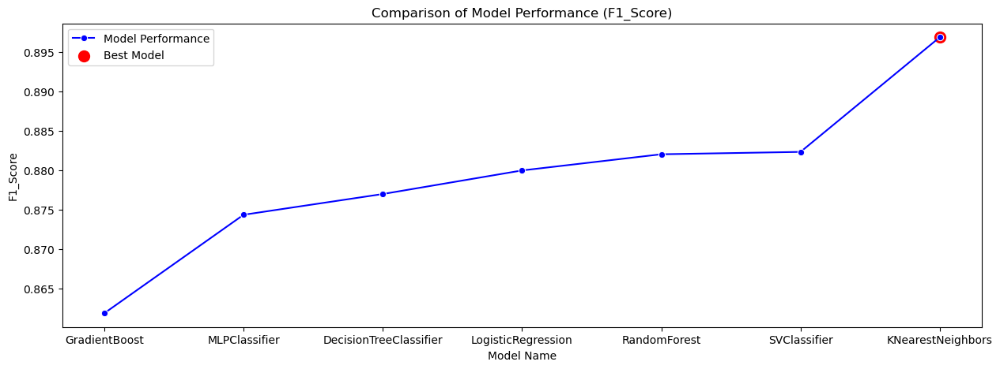

In [261]:
comparison_df = comparison_df.sort_values(by='F1_score', ascending=True)

max_index = comparison_df['F1_score'].idxmax() 

plt.figure(figsize=(15, 5))
sns.lineplot(data=comparison_df, x='Model', y='F1_score', marker='o', color='blue', label="Model Performance")

plt.scatter(comparison_df.loc[max_index, 'Model'], comparison_df.loc[max_index, 'F1_score'],color='red', s=100, label="Best Model")

plt.xlabel("Model Name")
plt.ylabel("F1_Score")

plt.legend()
plt.title("Comparison of Model Performance (F1_Score)")
plt.show()

## 9. CONCLUSION

This study analyzed a liver patient dataset from Northeast of Andhra Pradesh to identify key trends and risk factors contributing to liver disease. The findings highlight a higher prevalence among males and emphasize the urgency of early diagnosis, as many patients exhibit critically abnormal liver function markers.

By implementing various machine learning models, this study provides a data-driven approach to assist doctors in diagnosing liver disease efficiently. The K-Nearest Neighbors (KNN) model demonstrated the highest predictive accuracy, making it the most suitable model for this dataset. This model can serve as a decision-support tool, helping doctors prioritize high-risk patients, make informed treatment decisions, and improve patient outcomes.

## 10. CHALLENGES FACED

1. Extracting insights from the graph.
2. Domain Analysis on the features is quite challenging.
3. Took more computational time for some models.
4. Improvising the model F1_score through hyperparameter tuning.

## PROJECT DETAILS:
Project Team ID : PTID-CDS-JAN-25-2368

Project ID : PRCP-1007-LiverPatientPred

Team Members:

1. Adithya E - ecadithya12@gmail.com
2. Peraisoodan Viswanath S - peraisoodanviswanath.s@gmail.com
3. Nirmal Newton M - nirmalnewton2003@gmail.com
4. Sivadhasan K - sivadhasansd@gmail.com